In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
print(tf.__version__)
print(hub.__version__)
print("GPU Available 😍" if tf.config.list_physical_devices("GPU") else " Not Available 😒")

2.6.0
0.12.0
GPU Available 😍


In [ ]:
labels_csv=pd.read_csv('drive/MyDrive/Dig_Vision/labels.csv')

In [ ]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,13d470408dbbdc20b38ea32d3752edbb,scottish_deerhound
freq,1,126


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


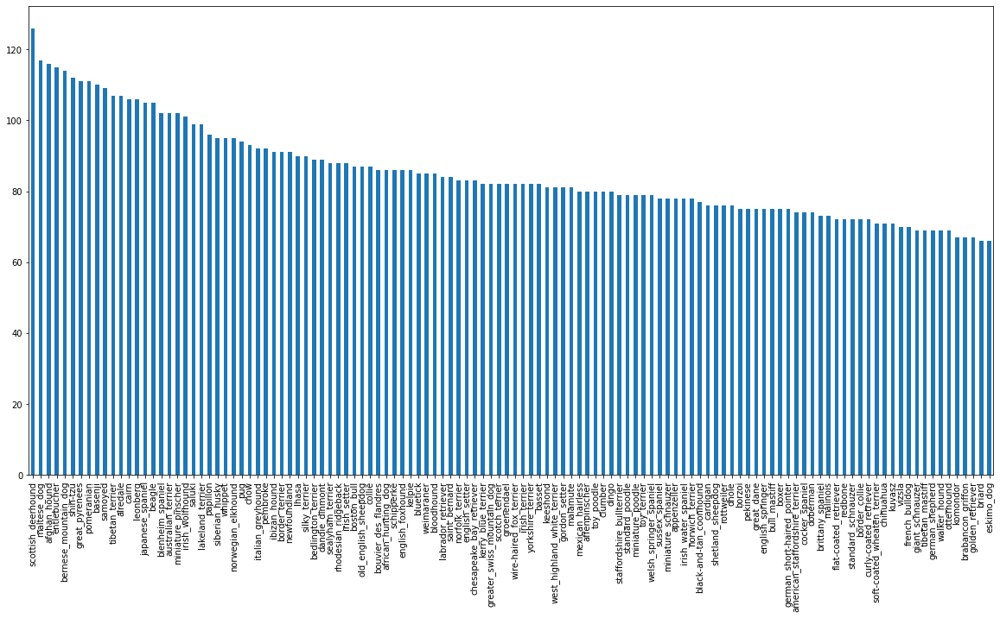

In [ ]:
labels_csv['breed'].value_counts().plot(kind='bar',figsize=(20,10));

In [ ]:
from IPython.display import display , Image

# Getting images and their labels

we've got the images and their labels , we'll use to create :
* A list fiepath to training images
* An array of all labels 
* An array of all unique labels

In [ ]:
filenames=['drive/MyDrive/Dig_Vision/train/'+fname+'.jpg' for fname in labels_csv['id']]
filenames[:10]

['drive/MyDrive/Dig_Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dig_Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dig_Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dig_Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dig_Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dig_Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dig_Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dig_Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dig_Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dig_Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os 
if len(os.listdir('drive/MyDrive/Dig_Vision/train/'))==len(filenames):
  print('match actual')
else:
  print('not match')

not match


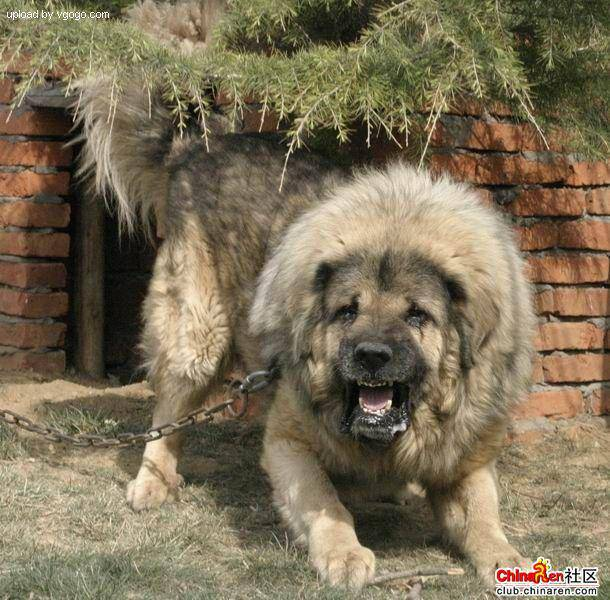

In [ ]:
Image(filenames[9000])

In [ ]:
labels=labels_csv['breed'].to_numpy()
labels[:10]
#len(labels)

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [ ]:
len(labels)==len(filenames)

True

In [ ]:
unique_breeds=np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
labels[0]

'boston_bull'

In [ ]:
labels[0]==unique_breeds

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels=[label ==np.unique(unique_breeds) for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Turning a boolean array into integers
print(labels[0])
print(np.where(unique_breeds==labels[0])[0][0])
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
19
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


# Creating our own validation set

In [ ]:
X=filenames
y=boolean_labels

In [ ]:
NUM_IMAGES=1000 #@param {type:"slider", min:1000, max:10000, step:1000}
NUM_IMAGES


1000

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],
                                             y[:NUM_IMAGES],
                                             test_size=0.2,
                                             random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:2],y_train[:2]

(['drive/MyDrive/Dig_Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dig_Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

# Preprocessing images (turning images into Tensors)

* Takes an image filename as input
* Uses TensorFlow to read the file and save it it a variable , image
* Turn our image (a jpeg file) into tensors
* Resize the images to be a shape(224,224
* Return the modified image

In [ ]:
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

And you can easily convert it to a tensor using `tf.constant()`

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [ ]:
IMG_SIZE=224
def process_image(image_path):
  # Read an image file
  image=tf.io.read_file(image_path)
  # Turn the JPEG image into numerical tensors with 3 channels 
  image=tf.image.decode_jpeg(image,channels=3)
  # convert the coulour channel values from 0-225 values to 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)
  # Resize the images to our desired size(224,224)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
  return image

# Creating data batches

In [ ]:
def get_image_label(image_path,label):
  '''
  Takes an image file path name and the associated label ,
  processes the images and return a tuple of(image,label)
  '''
  image=process_image(image_path)
  return image , label

In [ ]:
BATCH_SIZE=32
def create_data_batches(x,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  '''
  Creates batches of data out of image(x) and label(y) pairs.
  shuffles the data if it's training data but doesn't shuffle it if it's a valdation data
  Also accepts test data as input(no labels)
  '''
  if test_data:
    print('Creating test data batches ...')
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print("Creating validation data batches ...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                            tf.constant(y)))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  
  else:
    print('Creating Training data batches ...')
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                             tf.constant(y)))
    data=data.shuffle(buffer_size=len(x))
    data=data.map(get_image_label)
    data_batch=data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating Training data batches ...
Creating validation data batches ...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

# Visualizing data batches

In [ ]:
def show_25_images(images,labels):
  '''
  Diaplays 25 images from a data batch
  '''
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax=plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis('off')
    #unique_breeds[labels[i].argmax()]

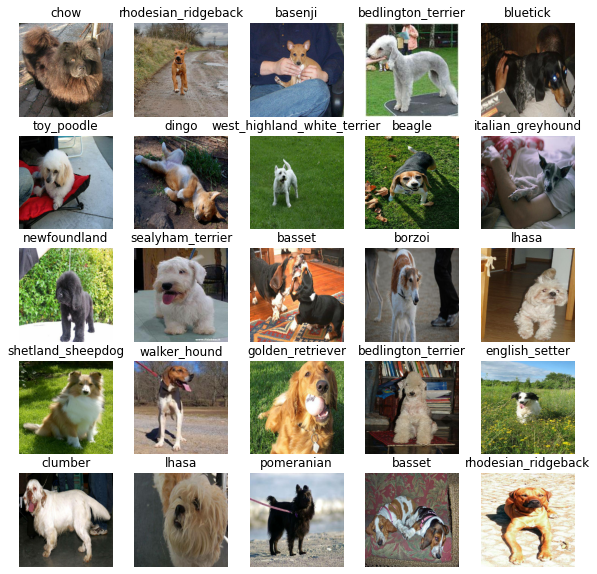

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

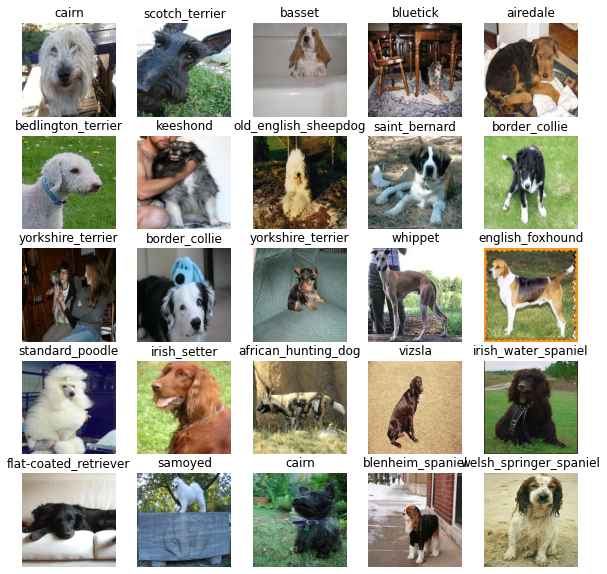

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Creating and training a model

In [ ]:
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]
OUTPUT_SHAPE=len(unique_breeds)
MODEL_URL='https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4'

In [ ]:
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print('Building model with :',MODEL_URL)
  model=tf.keras.Sequential([
                             hub.KerasLayer(MODEL_URL),
                             tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                    activation='softmax')
                            ])
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer='Adam',
      metrics=['accuracy']
  )
  model.build(INPUT_SHAPE)
  return model

In [ ]:
model=create_model()
model.summary()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


# Creating callbacks

TensorBoard Callback

In [ ]:
%load_ext tensorboard

In [ ]:
import datetime 
def create_tensorboard_callback():
  logdir=os.path.join('drive/MyDrive/Dig_Vision/logs',
                      datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                patience=3)

# Training a model (on a subset data)

In [ ]:
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESS!!!!)


In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
def train_model():
  '''
  Trains a given model and returns the trained version .
  '''
  model=create_model()
  tensorboard=create_tensorboard_callback()
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  return model

In [ ]:
model=train_model()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 338s 12s/step - loss: 4.6807 - accuracy: 0.0825 - val_loss: 3.3293 - val_accuracy: 0.2600
Epoch 2/100
25/25 [==============================] - 4s 146ms/step - loss: 1.6648 - accuracy: 0.6913 - val_loss: 2.0746 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 4s 164ms/step - loss: 0.5748 - accuracy: 0.9450 - val_loss: 1.6363 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 4s 145ms/step - loss: 0.2539 - accuracy: 0.9912 - val_loss: 1.4478 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 4s 147ms/step - loss: 0.1489 - accuracy: 0.9962 - val_loss: 1.3633 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 4s 153ms/step - loss: 0.1008 - accuracy: 1.0000 - val_loss: 1.3182 - val_accuracy: 0.6400
Epoch 7/100
25/25 [=============================

In [ ]:
%tensorboard --logdir drive/MyDrive/Dig_Vision/logs

<IPython.core.display.Javascript object>

# Make and evaluating predicitions using a trained model

In [ ]:
predictions=model.predict(val_data,verbose=1)

7/7 [==============================] - 43s 2s/step


In [ ]:
predictions

array([[0.00920704, 0.00464218, 0.00297198, ..., 0.00200379, 0.00227923,
        0.00583879],
       [0.01622673, 0.00085865, 0.00275703, ..., 0.00337516, 0.00686077,
        0.00335065],
       [0.0006935 , 0.00452691, 0.00277813, ..., 0.02249546, 0.02505336,
        0.00151448],
       ...,
       [0.00013843, 0.00705672, 0.00104529, ..., 0.00377334, 0.00129275,
        0.00040057],
       [0.0206656 , 0.00058064, 0.00244577, ..., 0.00036272, 0.00197562,
        0.0018105 ],
       [0.0039754 , 0.00234442, 0.00136176, ..., 0.01081069, 0.00035186,
        0.00350972]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
print(predictions[0])
print(f'Max value(probaility of prediction):{np.max(predictions[0])}')
print(f'Sum : {np.sum(predictions[0])}')
print(f'Max index :{np.argmax(predictions[0])}')
print(f'Predicted label :{unique_breeds[np.argmax(predictions[0])]}')

[9.20703635e-03 4.64217784e-03 2.97198351e-03 1.33115496e-03
 1.20953342e-03 8.38081446e-03 1.74967921e-03 4.74406686e-03
 3.10900458e-03 4.37165436e-04 4.83056763e-03 4.77396883e-04
 5.83866704e-03 5.59440209e-03 2.05060408e-01 3.47398291e-03
 6.43309765e-03 1.76118454e-03 1.58013601e-03 2.05009757e-03
 1.19300578e-02 5.94234606e-03 1.41758821e-03 6.97300420e-04
 1.51686622e-02 2.30592428e-04 3.52176110e-04 6.08810503e-03
 6.10298361e-04 1.92789419e-03 1.34830805e-03 1.15756802e-02
 9.00297426e-04 1.74973009e-03 7.13924237e-04 4.48172307e-03
 1.04390318e-03 4.22135321e-03 9.52612681e-05 3.41243073e-02
 8.74804799e-03 7.22570997e-03 3.21852555e-03 3.49795073e-03
 6.71417220e-03 1.84379402e-03 9.71914269e-03 9.51538153e-04
 2.39595561e-03 3.84200859e-04 7.61685485e-04 5.57739940e-03
 2.61174655e-03 1.81193813e-03 7.85916764e-03 4.31293482e-03
 7.48235453e-03 7.60119967e-03 1.11156162e-02 9.40455939e-04
 2.65256292e-03 1.62523780e-02 3.21310945e-03 2.42595840e-03
 5.23816161e-02 7.101036

In [ ]:
def get_pred_label(prediction_probabilities):
  '''
  Turn an array of prediction probabilites into a label
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label=get_pred_label(predictions[0])
pred_label

'bloodhound'

In [ ]:
def unbatchify(data):
  '''
  Takes a batched dataset of (image,label) Tensors and returns separate arrays of images and labels
  '''
  images=[]
  labels=[]
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

In [ ]:
val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  '''
  view the prediction , ground truth label and image for sample n
  '''
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]
  pred_label=get_pred_label(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

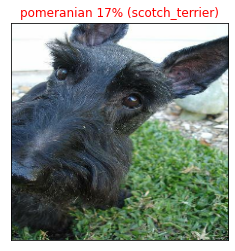

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

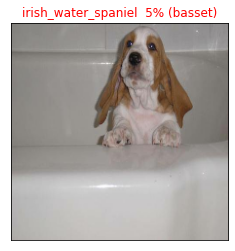

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=2)

In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  '''
  plots the top 10 highest prediction confidence along with 
  the truth label for sample n .
  '''
  pred_prob,true_label=prediction_probabilities[n],labels[n]
  pred_label=get_pred_label(pred_prob)

  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


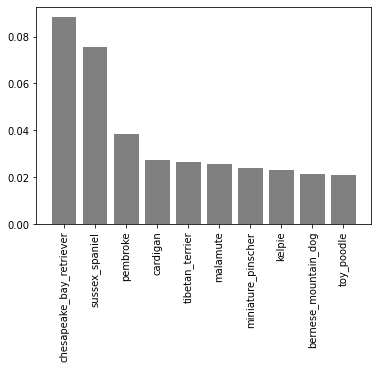

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

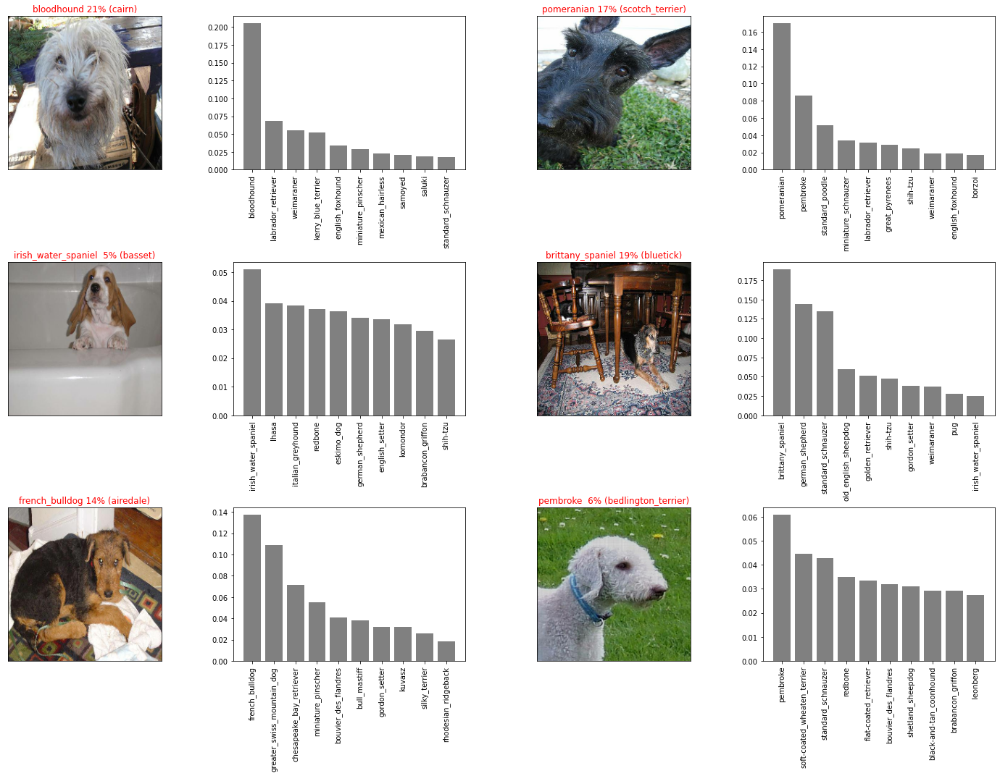

In [ ]:
i_multiplier=0
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(5*2*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

# Saving and reloading a model

In [ ]:
def save_model(model,suffix=None):
  '''
  saves a given model in a model directory and appends a suffix(str)
  for clarity and resue .
  '''
  modeldir=os.path.join('drive/MyDrive/Dig_Vision/models',
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=modeldir+'-'+suffix+'.h5'
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/MyDrive/Dig_Vision/models/20210901-21551630533301-1000-images-Adam.h5...


'drive/MyDrive/Dig_Vision/models/20210901-21551630533301-1000-images-Adam.h5'

In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
model_1000_images=load_model('drive/MyDrive/Dig_Vision/models/20210831-21321630445524-1000-images-Adam.h5')

Loading saved model from: drive/MyDrive/Dig_Vision/models/20210831-21321630445524-1000-images-Adam.h5


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 2s 121ms/step - loss: 5.8871 - accuracy: 0.0000e+00


[5.887115478515625, 0.0]

In [ ]:
model_1000_images.evaluate(val_data)

7/7 [==============================] - 2s 130ms/step - loss: 1.3300 - accuracy: 0.6450


[1.330020546913147, 0.6449999809265137]

# Training a big dog (on a full data)

In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
full_data=create_data_batches(X,y)

Creating Training data batches ...


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
full_model=create_model()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
full_model_tensorboard=create_tensorboard_callback()
full_modl_ealy_stopping=tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                         patience=3)

In [ ]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_modl_ealy_stopping])

Epoch 1/100
320/320 [==============================] - 2932s 9s/step - loss: 1.3270 - accuracy: 0.6702
Epoch 2/100
320/320 [==============================] - 40s 126ms/step - loss: 0.4003 - accuracy: 0.8824
Epoch 3/100
320/320 [==============================] - 40s 124ms/step - loss: 0.2360 - accuracy: 0.9368
Epoch 4/100
320/320 [==============================] - 40s 124ms/step - loss: 0.1536 - accuracy: 0.9624
Epoch 5/100
320/320 [==============================] - 40s 124ms/step - loss: 0.1055 - accuracy: 0.9786
Epoch 6/100
320/320 [==============================] - 40s 124ms/step - loss: 0.0766 - accuracy: 0.9869
Epoch 7/100
320/320 [==============================] - 40s 124ms/step - loss: 0.0587 - accuracy: 0.9909
Epoch 8/100
320/320 [==============================] - 40s 124ms/step - loss: 0.0484 - accuracy: 0.9930
Epoch 9/100
320/320 [==============================] - 40s 124ms/step - loss: 0.0378 - accuracy: 0.9959
Epoch 10/100
320/320 [==============================] - 40s 126ms

In [ ]:
#save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

In [ ]:
loaded_full_model = load_model('drive/MyDrive/Dig_Vision/models/20210901-18311630521110-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dig_Vision/models/20210901-18311630521110-full-image-set-mobilenetv2-Adam.h5


# Making predictions on the test dataset

In [ ]:
test_path='drive/MyDrive/Dig_Vision/test/'
test_filenames=[test_path+fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dig_Vision/test/e4b7ff61849485992246c0f2ab7e8804.jpg',
 'drive/MyDrive/Dig_Vision/test/e587c21aedc81f89b83dd326e034e7e0.jpg',
 'drive/MyDrive/Dig_Vision/test/e36ec4ab8218060660ec82fd6c4757a7.jpg',
 'drive/MyDrive/Dig_Vision/test/e06fdea86b416e992137ad52bb5da5a8.jpg',
 'drive/MyDrive/Dig_Vision/test/ddf2401701ee374c0f1f9dd607071ec7.jpg',
 'drive/MyDrive/Dig_Vision/test/df47feaaf3dfb33cf712cccdddc8060e.jpg',
 'drive/MyDrive/Dig_Vision/test/ede0dddd46a46f8f6467b7fbd1b4958a.jpg',
 'drive/MyDrive/Dig_Vision/test/f20017c781603ca2d286361592b12dc4.jpg',
 'drive/MyDrive/Dig_Vision/test/e90bd6aa38e304f67db74f757df9a834.jpg',
 'drive/MyDrive/Dig_Vision/test/ec0a814cc971dbe6e618a9a37ba355f8.jpg']

In [ ]:
test_data=create_data_batches(test_filenames,test_data=True)

Creating test data batches ...


In [ ]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 1241s 4s/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dig_Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
test_predictions = np.loadtxt("drive/MyDrive/Dig_Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[4.75047016e-11, 3.97206129e-10, 1.75283063e-12, ...,
        7.34297012e-10, 2.11142002e-08, 9.22763022e-09],
       [3.85325279e-07, 1.57203931e-06, 3.15405977e-08, ...,
        1.07440201e-06, 4.24698010e-06, 6.92417998e-08],
       [1.37086620e-10, 1.73741256e-07, 2.59422605e-11, ...,
        3.97427975e-08, 1.88863714e-06, 2.25821445e-11],
       ...,
       [1.54492719e-09, 1.06208826e-11, 2.50071941e-09, ...,
        8.46896997e-11, 1.85355642e-08, 9.23221933e-07],
       [1.36255902e-11, 5.47043799e-10, 8.32854508e-10, ...,
        7.47555617e-08, 6.97192526e-10, 3.50567596e-11],
       [6.33245192e-12, 3.01373643e-06, 1.59777386e-10, ...,
        3.53767746e-06, 5.74129688e-10, 2.66577580e-12]])

# Preparing test dataset and predictions for kaggle

In [ ]:
preds_df=pd.DataFrame(columns=['id']+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id']=test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e4b7ff61849485992246c0f2ab7e8804,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e587c21aedc81f89b83dd326e034e7e0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e36ec4ab8218060660ec82fd6c4757a7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e06fdea86b416e992137ad52bb5da5a8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ddf2401701ee374c0f1f9dd607071ec7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
preds_df[list(unique_breeds)]=test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e4b7ff61849485992246c0f2ab7e8804,4.75047e-11,3.97206e-10,1.75283e-12,3.29643e-08,5.99396e-10,5.95046e-10,2.1958e-09,2.64172e-10,1.445e-12,9.50458e-13,7.87887e-12,4.50571e-13,2.6907e-06,2.05143e-12,1.46712e-12,3.72476e-12,3.87581e-12,1.94848e-12,4.60374e-10,2.49698e-11,4.01272e-11,6.22796e-10,6.55427e-10,3.25678e-11,1.78241e-13,1.22535e-12,2.91245e-14,9.04544e-14,1.08558e-11,8.41488e-11,2.64656e-12,1.60104e-13,6.0643e-13,6.74974e-12,9.35683e-09,2.93688e-13,6.62487e-13,1.75484e-10,0.999963,...,6.7258e-12,9.56206e-13,3.94639e-12,1.92923e-11,4.27418e-10,3.73636e-12,1.18167e-12,1.4103e-09,9.09676e-13,8.66098e-10,7.36745e-09,5.49018e-07,3.88272e-13,5.56798e-12,1.87903e-11,4.23815e-11,3.42219e-10,3.19319e-10,2.37582e-09,9.174e-10,1.22707e-14,2.38479e-11,1.72364e-11,1.71478e-10,7.1094e-09,5.18692e-13,1.67017e-08,9.47386e-13,1.86893e-11,5.06182e-12,1.6465e-11,2.33124e-09,4.84451e-10,2.32101e-09,4.81671e-11,6.63907e-10,1.99818e-10,7.34297e-10,2.11142e-08,9.22763e-09
1,e587c21aedc81f89b83dd326e034e7e0,3.85325e-07,1.57204e-06,3.15406e-08,1.61033e-05,7.86863e-08,2.69552e-07,3.41224e-09,1.66079e-08,3.28886e-07,3.41878e-09,0.0479084,1.36628e-07,3.54461e-08,3.23659e-09,1.25092e-09,5.16399e-05,2.78809e-09,3.9924e-05,3.87324e-10,5.18166e-07,0.000287856,1.67683e-07,1.03709e-08,6.47797e-08,3.84974e-05,2.30284e-08,5.58804e-06,4.37804e-10,3.5749e-05,1.37887e-06,6.61309e-08,0.000134118,7.54741e-07,1.37929e-06,9.73273e-05,0.0101256,1.49018e-08,3.53838e-08,1.90879e-08,...,5.20575e-05,2.54053e-08,2.49326e-05,7.24837e-07,1.4582e-07,1.97181e-07,5.13188e-10,3.24725e-07,5.25472e-08,0.000148633,2.76335e-10,2.6295e-09,1.4769e-09,5.49874e-07,6.85477e-07,3.87853e-07,8.81411e-09,0.00398248,3.42333e-07,9.31652e-10,2.23084e-06,2.25876e-07,3.27326e-07,0.00473205,3.58301e-06,0.201466,6.11181e-07,8.87198e-06,2.15972e-06,0.000132475,0.000885717,3.59625e-08,8.04123e-06,1.3201e-07,7.85787e-06,3.30866e-10,1.00023e-08,1.0744e-06,4.24698e-06,6.92418e-08
2,e36ec4ab8218060660ec82fd6c4757a7,1.37087e-10,1.73741e-07,2.59423e-11,3.22869e-10,1.10142e-09,3.81557e-08,1.68874e-08,8.06778e-08,0.000219173,1.1975e-08,2.06236e-07,3.95958e-13,4.00844e-05,1.41489e-09,0.000165588,1.74303e-06,3.96879e-09,1.4935e-09,3.78586e-11,7.58254e-11,5.3604e-11,7.22766e-07,1.52948e-07,3.87867e-11,9.21819e-09,2.3962e-09,2.356e-11,1.70104e-10,1.33729e-07,6.83775e-12,2.16924e-08,8.08785e-09,1.36105e-08,1.21012e-10,1.29863e-08,1.19161e-07,1.18289e-07,9.33963e-09,3.19739e-07,...,5.3976e-10,1.41613e-10,1.44323e-08,6.76261e-08,1.09085e-09,4.87252e-11,2.01214e-08,2.82521e-11,4.61401e-10,0.998094,0.000993444,3.83581e-09,7.94139e-10,9.49094e-09,4.33544e-10,3.11831e-11,2.40169e-11,7.37082e-09,3.47552e-08,9.04702e-11,5.35098e-11,1.75496e-09,1.01725e-08,1.33856e-08,2.01358e-09,2.47176e-07,1.45145e-07,4.88619e-10,5.57665e-10,1.49394e-08,5.92117e-10,7.55442e-10,0.000338065,1.45722e-05,5.30647e-07,1.7903e-09,5.79486e-10,3.97428

In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dig_Vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)